# Final Model - conditional GAN with super resolution

For our final model we will investigate the performance of generating 256X256 images by training a Conditional GAN translation model to generate 128x128 images and training a separate model to scale the resolution of the images to 256x256. Our hypothesis is that we will be able to train a more stable network at 128x128 and we will be able to leverage a super resolution algorithm to achieve sharper, less blurry results than our baseline 256x256 results.

We will experiment with using a ResNet based generator in our condition GAN. We will compare the performance with the U Net generator used in the Pix2pix paper. 

We will use a pre implemented OpenCV deep CNN based on the paper "Enhanced Deep Residual Networks for Single Image Super-Resolution"

In [1]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display
import keras

In [2]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 128
IMG_HEIGHT = 128

In [3]:
def load(image_file):
  '''
  load in a jpeg file containing both the input image and the target imaage
  '''
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, w:, :]
  input_image = image[:, :w, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

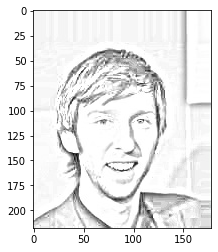

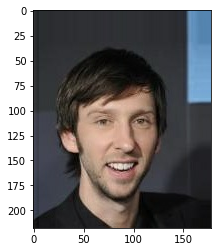

In [4]:
inp, re = load('./sketch_data/train/002012.jpg')
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [5]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

# normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

# a function to randomly transform images, this was used in the original pix2pix paper 
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 144, 144)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

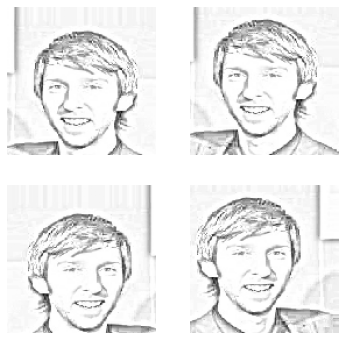

In [6]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [7]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [8]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

# Create Train and Test sets

In [9]:
train_dataset = tf.data.Dataset.list_files('./sketch_data/train/*.jpg')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [10]:
test_dataset = tf.data.Dataset.list_files('./sketch_data/test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
train_dataset.take(1)

<TakeDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 3)), types: (tf.float32, tf.float32)>

# Define ResNet / UNet Generators

In [11]:
OUTPUT_CHANNELS = 3

In [12]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [13]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [14]:
def res_block(input, filters, kernel_size=(3,3), strides=(1,1), apply_dropout=True):
    """
    creates a new res block to be used as part of a ResNet
    contains two convolutional layers with an identity layer between the input and output of the block
    the dimensions of the input and output are the same
    """
    x = tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides,padding='same')(input)
    
    # add normalization and activation
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    # add dropout
    if apply_dropout:
        x = tf.keras.layers.Dropout(0.5)(x)

    # add second convolutional layer
    x = tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides,padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)

    # Two convolution layers followed by a direct connection between input and output
    x = tf.keras.layers.Add()([input, x])
    # final activation
    x = tf.keras.layers.Activation('relu')(x)

    return x

In [15]:
def ResNet(blocks = 7):
  '''
  function to define our generator network
  the parameter stack_depth is used to explore the performance ov various layer depths, max value is 2
  '''
  inputs = tf.keras.layers.Input(shape=[64,64,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
  ]


  up_stack = [
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)
  skips = reversed(skips[:-1])


  # inserting res blocks in the middle of the network
  for i in range(blocks):
    x = res_block(x, 256)


  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

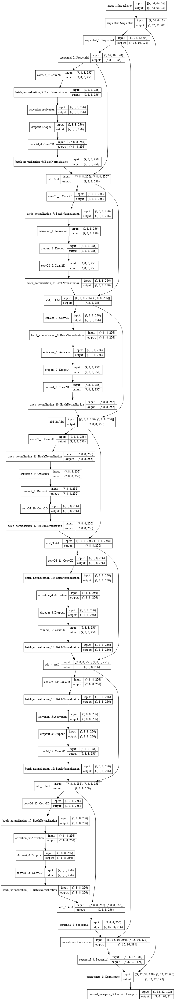

In [16]:
res = ResNet()
tf.keras.utils.plot_model(res, show_shapes=True, dpi=64)

In [17]:
def UNet(stack_depth=2):
  '''
  function to define our generator network
  the parameter stack_depth is used to explore the performance ov various layer depths, max value is 2
  '''
  inputs = tf.keras.layers.Input(shape=[128,128,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
  ]

  # add set number of layers to encoder stack
  for i in range(stack_depth):
    down_stack.append(downsample(512,4))

  # add set number of layers to decoder stack
  up_stack = []
  for i in range(stack_depth):
    up_stack.append(upsample(512,4,apply_dropout=True))

  up_stack += [
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
generator = UNet(2)

In [18]:
LAMBDA = 100

In [19]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

# Define Discriminator

In [21]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [22]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [23]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

# Define helper functions for generating / saving images

In [24]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [25]:
def save_images(model, test_input, tar, path):
    prediction = model(test_input, training=True)

    tf.keras.preprocessing.image.save_img(path+"input.jpg", test_input[0])
    tf.keras.preprocessing.image.save_img(path+"target.jpg", tar[0])
    tf.keras.preprocessing.image.save_img(path+"generated.jpg", prediction[0])

# Define Training Loop

In [26]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [27]:
def train_step(model, input_image, target, epoch, logs=False):
  # unpack model attributes
  generator = model["generator"]
  discriminator = model["discriminator"]
  generator_optimizer = model["generator_optimizer"]
  discriminator_optimizer = model["discriminator_optimizer"]

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    # the discriminator classifies the both the real pair and the generated pair
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  if logs:
    with summary_writer.as_default():
      tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
      tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
      tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
      tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [28]:
def fit(model, train_ds, test_ds, epochs):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(model["generator"], example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(model, input_image, target, epoch)
    print()

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))

# Train UNetgenerator on a subset of the data

In [36]:
! mkdir results

In [30]:
train_subset = train_dataset.take(200)
validate = test_dataset.take(5)

In [31]:
EPOCHS = 20

In [32]:
unet_model = {}

unet_model['generator'] = UNet()
unet_model['discriminator'] = Discriminator()

unet_model['generator_optimizer'] = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
unet_model['discriminator_optimizer'] = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

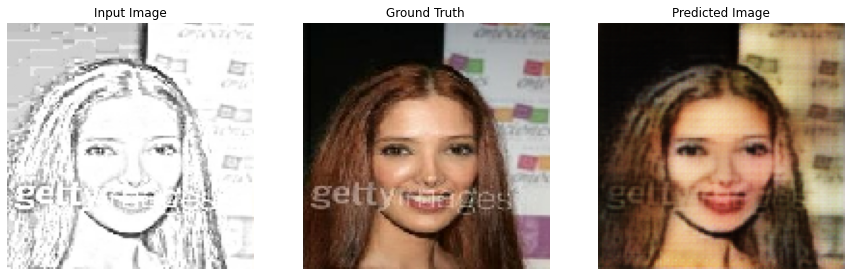

Epoch:  19
....................................................................................................
....................................................................................................

Time taken for epoch 20 is 17.86974000930786 sec



In [34]:
fit(unet_model, train_subset, test_dataset, EPOCHS)

In [37]:
# save unet samples
sample = 0
filepath = './results/unet_sample_'

for i, (inp, tar) in validate.enumerate():
  save_images(unet_model["generator"], inp, tar, filepath+str(sample)+'_')
  sample += 1

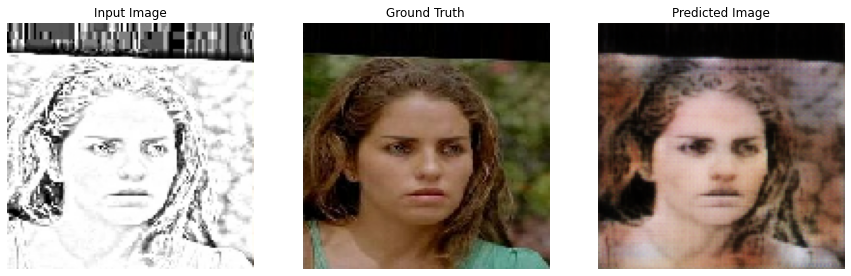

Epoch:  19
....................................................................................................
....................................................................................................

Time taken for epoch 20 is 27.569567441940308 sec



In [38]:
# compare the performane of resnets with various depths

resnet_models = {}

for num_blocks in [5,9,13]:
  model = {}

  model["generator"] = ResNet(blocks = num_blocks)
  model["discriminator"] = Discriminator()

  model["generator_optimizer"] = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
  model["discriminator_optimizer"] = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

  fit(model, train_subset, test_dataset, EPOCHS)

  # save model to dictionary
  name = 'blocks=' + str(num_blocks) 
  resnet_models[name] = model

  # save sample outputs
  sample = 0
  filepath = './results/' + name + '_sample_'
  for i, (inp, tar) in validate.enumerate():
    save_images(model["generator"], inp, tar, filepath+str(sample)+'_')
    sample += 1


# Compare results from the different models

U Net


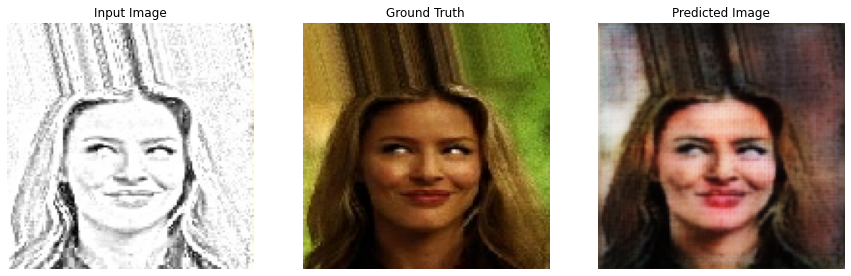

blocks=5


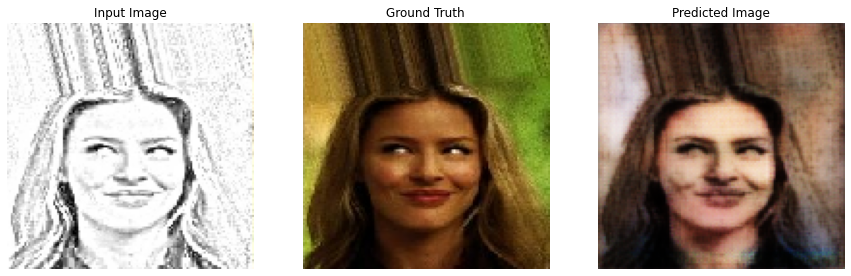

blocks=9


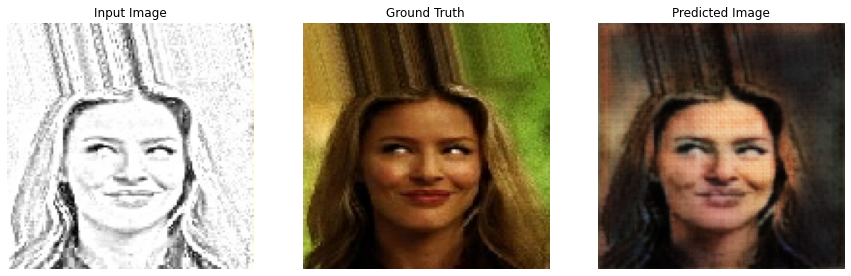

blocks=13


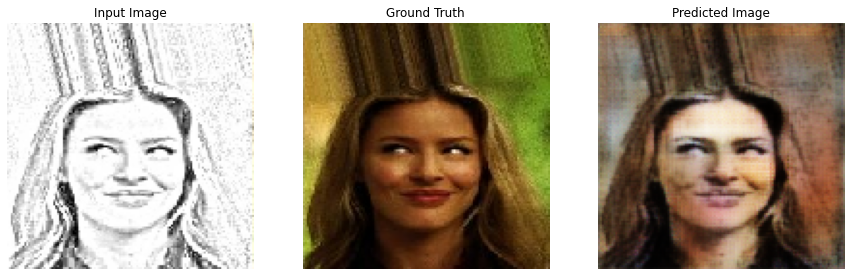

U Net


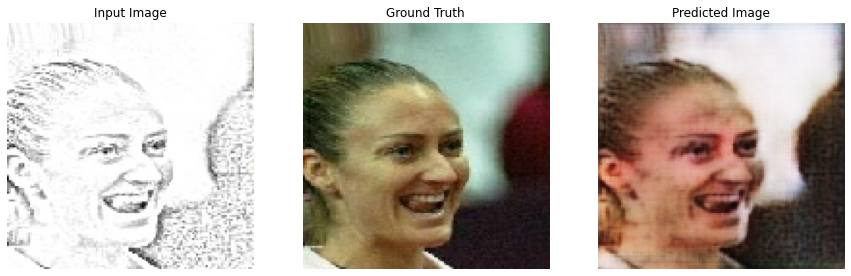

blocks=5


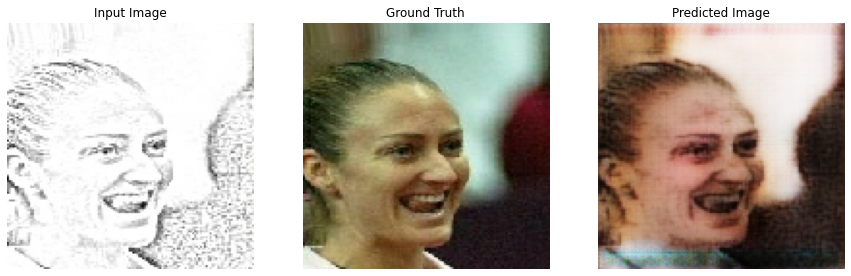

blocks=9


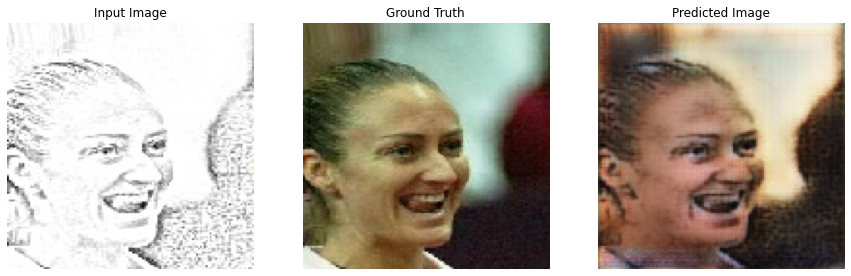

blocks=13


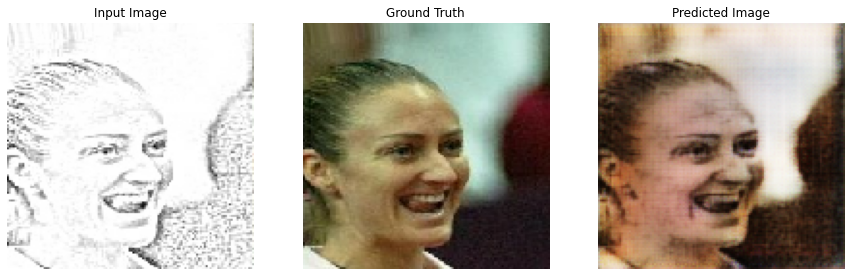

U Net


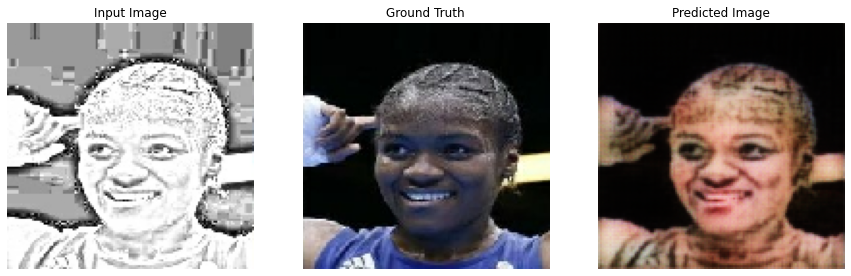

blocks=5


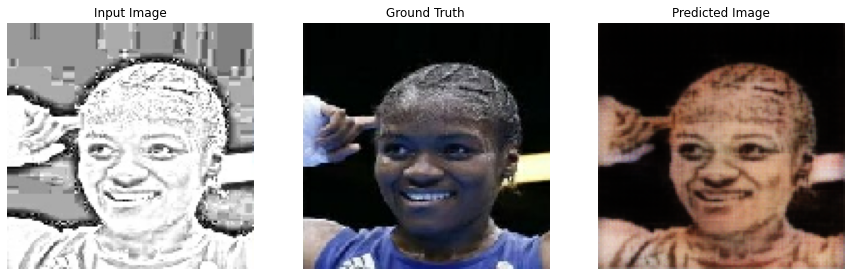

blocks=9


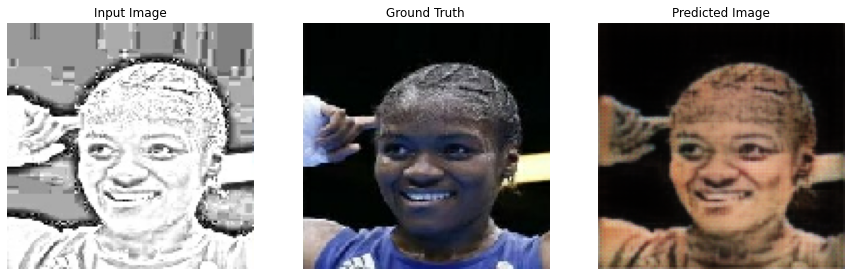

blocks=13


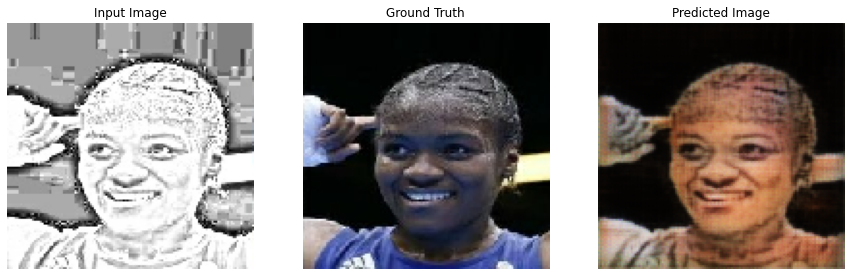

U Net


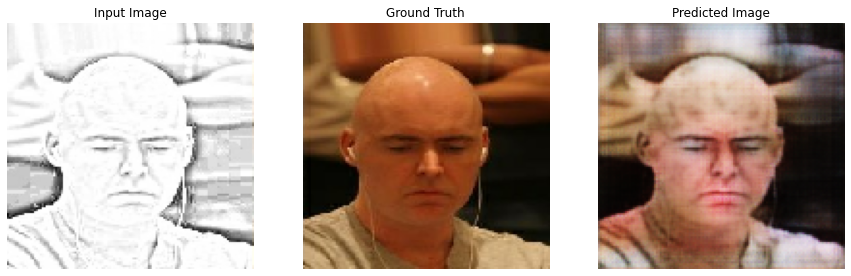

blocks=5


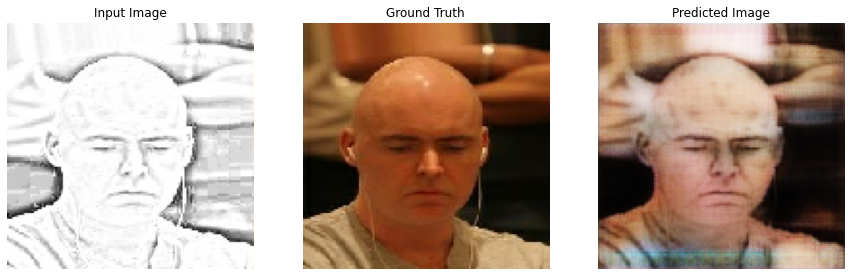

blocks=9


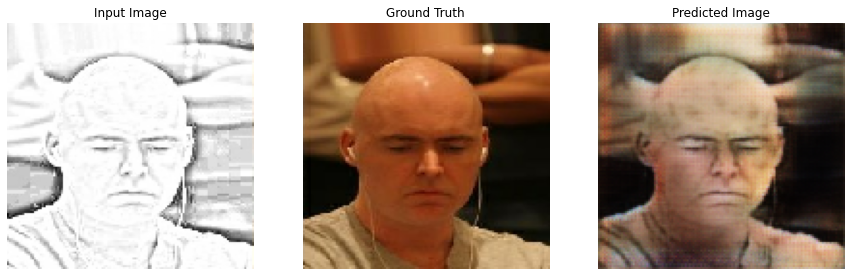

blocks=13


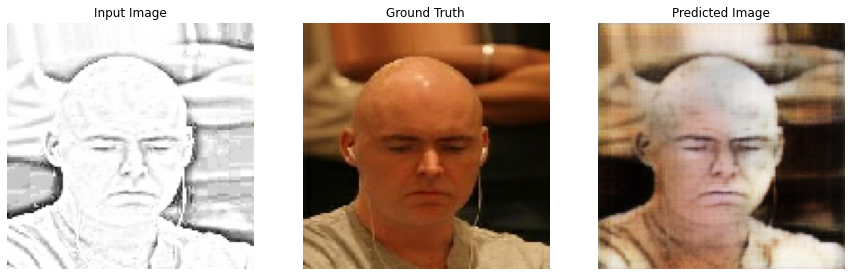

U Net


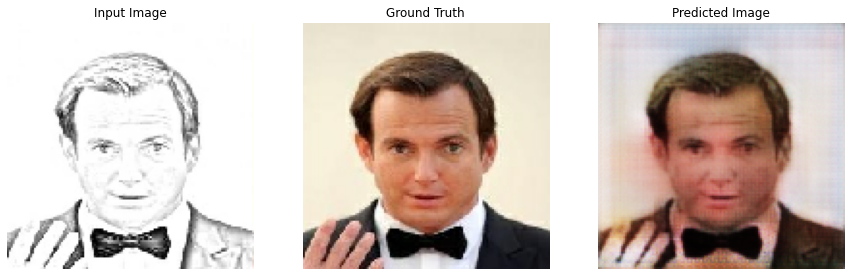

blocks=5


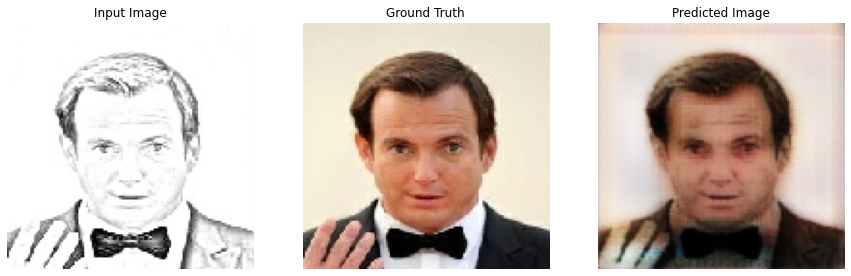

blocks=9


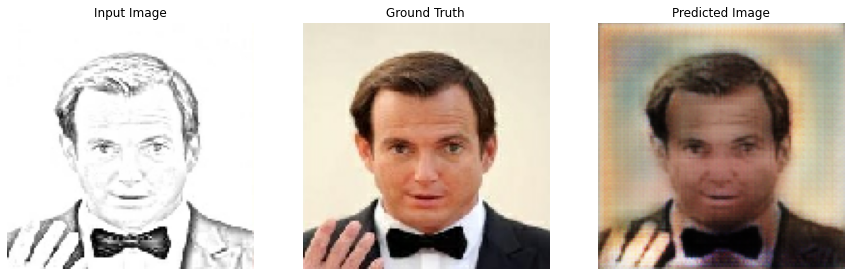

blocks=13


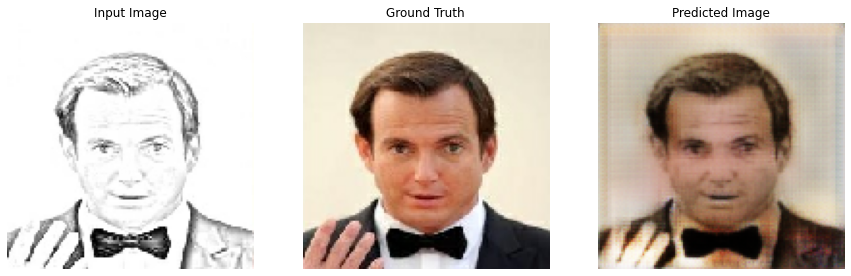

In [41]:
for i, (inp, tar) in validate.enumerate():
  print("U Net")
  generate_images(unet_model['generator'], inp, tar)

  for name in resnet_models.keys():
    print(name)
    model = resnet_models[name]
    generate_images(model['generator'], inp, tar)

All of the models are comparable. We will train a resnet model with 9 blocks on the entire dataset.

In [44]:
final_model = {}

final_model['generator'] = ResNet(blocks=9)
final_model['discriminator'] = Discriminator()

final_model['generator_optimizer'] = tf.keras.optimizers.Adam(0.0002, beta_1=0.5)
final_model['discriminator_optimizer'] = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

In [45]:
EPOCHS = 100

In [46]:
print("Training images:",len(train_dataset))

Training images: 2000


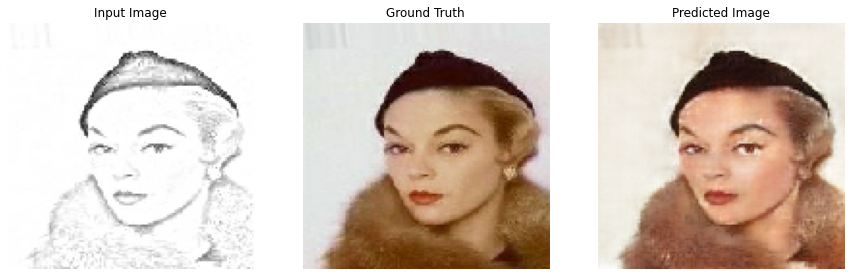

Epoch:  99
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
................................................................................

In [47]:
fit(final_model, train_dataset, test_dataset, EPOCHS)

In [48]:
final_model['generator'].save_weights('resnet9.h5')

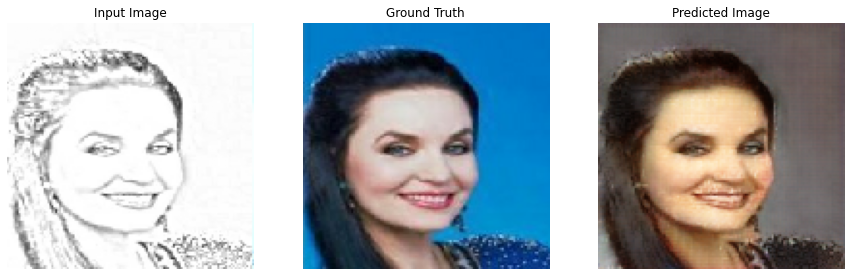

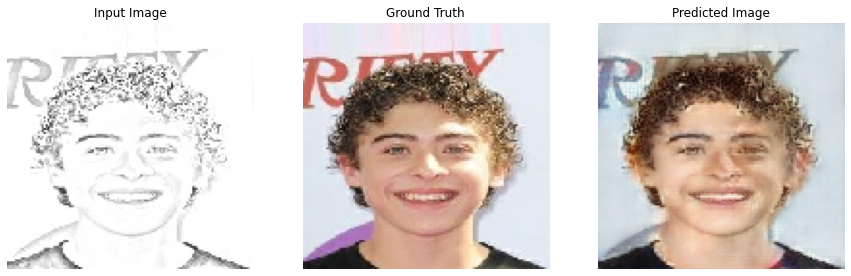

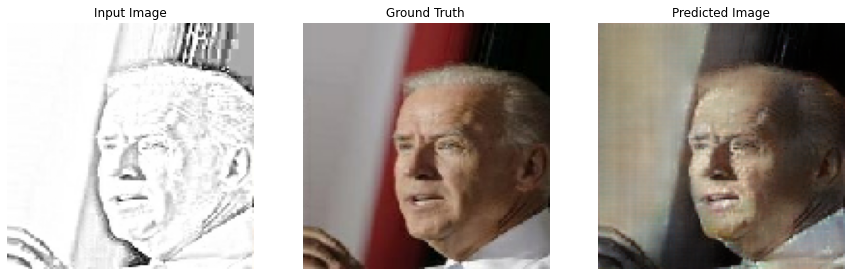

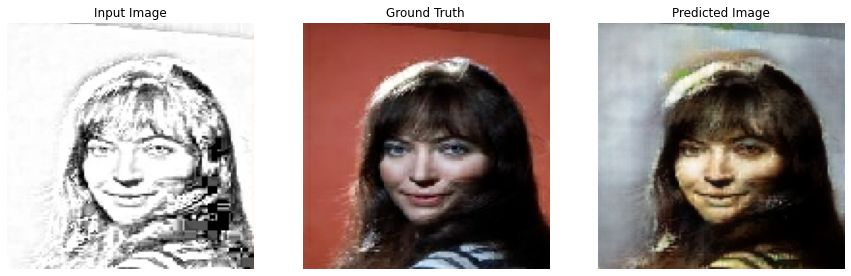

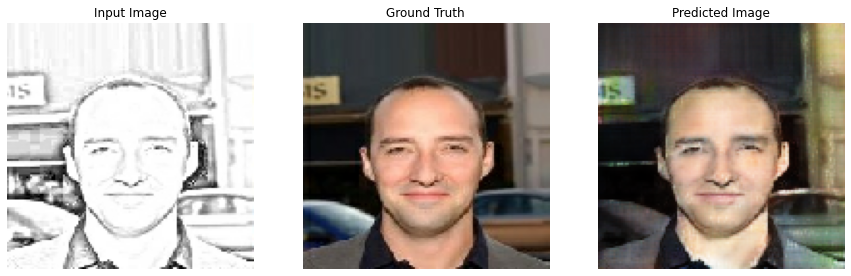

...

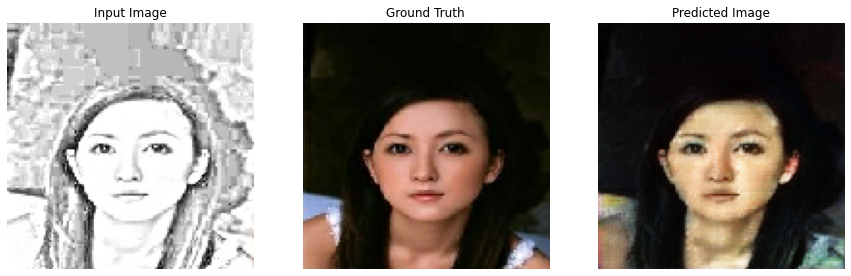

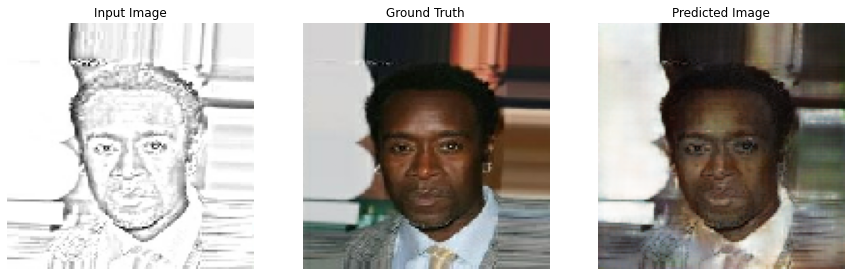

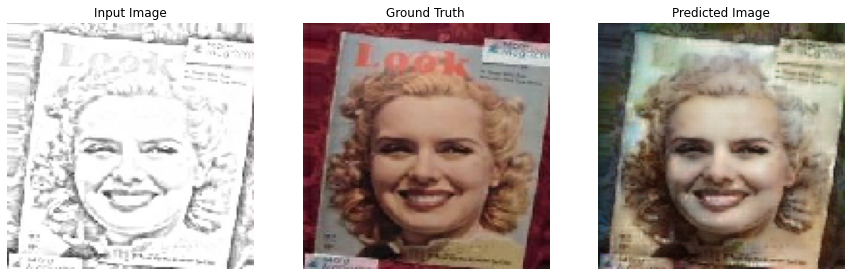

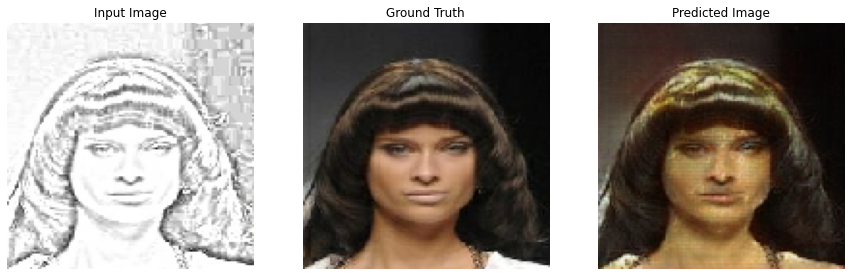

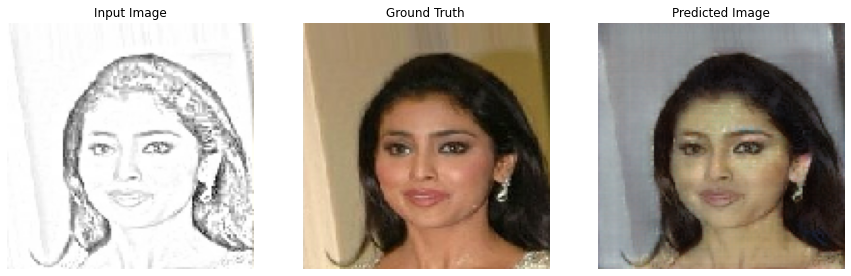

In [49]:
sample = 1
for inp,tar in test_dataset.take(20):
  generate_images(final_model['generator'], inp, tar)
  save_images(final_model["generator"], inp, tar, "./results/final_sample_"+str(sample)+'_')
  sample += 1

# Add super resolution using opencv

We will use a pretrained CNN to scale our image to 256x256. The architecture we are using is based on the paper `Enhanced Deep Residual Networks for Single Image Super-Resolution` and the weights were obtained from `https://github.com/Saafke/EDSR_Tensorflow`

In [ ]:
! pip install -U opencv-contrib-python 

In [1]:
import cv2
from cv2 import dnn_superres

# Set our model and load weights
sr = dnn_superres.DnnSuperResImpl_create()
path = "EDSR_x2.pb"
sr.readModel(path)
# Using EDSR model for upscaling with a factor of 2
sr.setModel("edsr", 2)

In [2]:
def get_predictions(x, generator, superres):
    ''' 
    Takes in a 128x128 image x and returns a translated 256x256 image
    '''
    return superres.upsample(generator(x))